# Analysis of US Youtube Trending Videos

## Individual  Project 2

<font size=4>__DATS 6013(O10)__   -   __Zhiyuan Tao__   -   __G45055489__</font>

<font size=3>__motivations:__  
The long-term goal for me to learn data mining is to find patterns that could show people's psychological motivations and needs deep in haert. I believe the government and companies could provide us with better services and products with these kind of research.   
\
This project is the beginning of this big theme. I obtain the data of YouTube top trending videos from Nov. 2017 to June 2018. To investigate the attributes of videos, something about what videos and topics could be attractive and what people's online behavior pattern are could be discovered.   
\
__The main objectives of this project are:__
1. Show the distribution and correlation of attributes of trending videos.
2. Show what do people like to watch and try to find some intrinsic reasons behind it.</font>

In [1]:
import numpy as np
import pandas as pd

import os
import json

In [2]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mc
from matplotlib import ticker
from matplotlib.ticker import MultipleLocator
from matplotlib.ticker import FuncFormatter

In [3]:
import seaborn as sns
import plotly.figure_factory as ff
import plotly.offline as py
#import plotly.graph_objs as go
import plotly.graph_objects as go

In [4]:
#from subprocess import check_output
from wordcloud import WordCloud, STOPWORDS

# data collection

__Trending YouTube Video Statistics__\
https://www.kaggle.com/datasnaek/youtube-new?select=USvideos.csv

In [5]:
df = pd.read_csv("USvideos.csv")
df0=df
df.head(2)

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John..."


In [6]:
# check the data types
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40949 entries, 0 to 40948
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   video_id                40949 non-null  object
 1   trending_date           40949 non-null  object
 2   title                   40949 non-null  object
 3   channel_title           40949 non-null  object
 4   category_id             40949 non-null  int64 
 5   publish_time            40949 non-null  object
 6   tags                    40949 non-null  object
 7   views                   40949 non-null  int64 
 8   likes                   40949 non-null  int64 
 9   dislikes                40949 non-null  int64 
 10  comment_count           40949 non-null  int64 
 11  thumbnail_link          40949 non-null  object
 12  comments_disabled       40949 non-null  bool  
 13  ratings_disabled        40949 non-null  bool  
 14  video_error_or_removed  40949 non-null  bool  
 15  de

In [7]:
# check the numerical attributes
pd.options.display.float_format = '{:,.1f}'.format 
df.describe()

,category_id,views,likes,dislikes,comment_count
count,"40,949.0","40,949.0","40,949.0","40,949.0","40,949.0"
mean,20.0,"2,360,784.6","74,266.7","3,711.4","8,446.8"
std,7.6,"7,394,113.8","228,885.3","29,029.7","37,430.5"
min,1.0,549.0,0.0,0.0,0.0
25%,17.0,"242,329.0","5,424.0",202.0,614.0
50%,24.0,"681,861.0","18,091.0",631.0,"1,856.0"
75%,25.0,"1,823,157.0","55,417.0","1,938.0","5,755.0"
max,43.0,"225,211,923.0","5,613,827.0","1,674,420.0","1,361,580.0"


In [8]:
with open("US_category_id.json") as f:
    categories = json.load(f)["items"]
ct_dict = {}
for ct in categories:
    ct_dict[int(ct["id"])] = ct["snippet"]["title"]
df['category_name']=df['category_id'].map(ct_dict)

In [9]:
df

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_name
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,People & Blogs
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",Entertainment
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,Entertainment
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40944,BZt0qjTWNhw,18.14.06,The Cat Who Caught the Laser,AaronsAnimals,15,2018-05-18T13:00:04.000Z,"aarons animals|""aarons""|""animals""|""cat""|""cats""...",1685609,38160,1385,2657,https://i.ytimg.com/vi/BZt0qjTWNhw/default.jpg,False,False,False,The Cat Who Caught the Laser - Aaron's Animals,Pets & Animals
40945,1h7KV2sjUWY,18.14.06,True Facts : Ant Mutualism,zefrank1,22,2018-05-18T01:00:06.000Z,[none],1064798,60008,382,3936,https://i.ytimg.com/vi/1h7KV2sjUWY/default.jpg,False,False,False,NaN,People & Blogs
40946,D6Oy4LfoqsU,18.14.06,I GAVE SAFIYA NYGAARD A PERFECT HAIR MAKEOVER ...,Brad Mondo,24,2018-05-18T17:34:22.000Z,I gave safiya nygaard a perfect hair makeover ...,1066451,48068,1032,3992,https://i.ytimg.com/vi/D6Oy4LfoqsU/default.jpg,False,False,False,I had so much fun transforming Safiyas hair in...,Entertainment
40947,oV0zkMe1K8s,18.14.06,How Black Panther Should Have Ended,How It Should Have Ended,1,2018-05-17T17:00:04.000Z,"Black Panther|""HISHE""|""Marvel""|""Infinity War""|...",5660813,192957,2846,13088,https://i.ytimg.com/vi/oV0zkMe1K8s/default.jpg,False,False,False,How Black Panther Should Have EndedWatch More ...,Film & Animation


# visualization

# 1 Individual Distribution of Attributes 

## 1.1 users ineractions ( view, likes, dislikes, comments )

In [10]:
indicators=['views','likes','dislikes','comment_count']

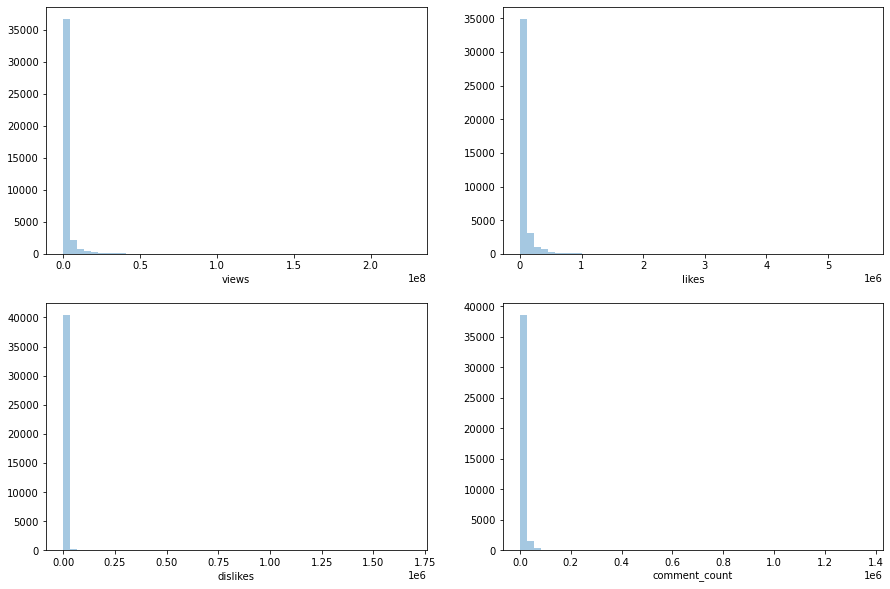

In [11]:
fig, ((ax1, ax2),(ax3, ax4)) = plt.subplots(2,2,figsize=(15,10))

for i, axs in enumerate([[ax1, ax2], [ax3, ax4]]):
    for j, ax in enumerate(axs):
        sns.distplot(df[indicators[i+j+i]], ax=ax, kde=False)

### Apply the logarithm operation

#### log with y axis

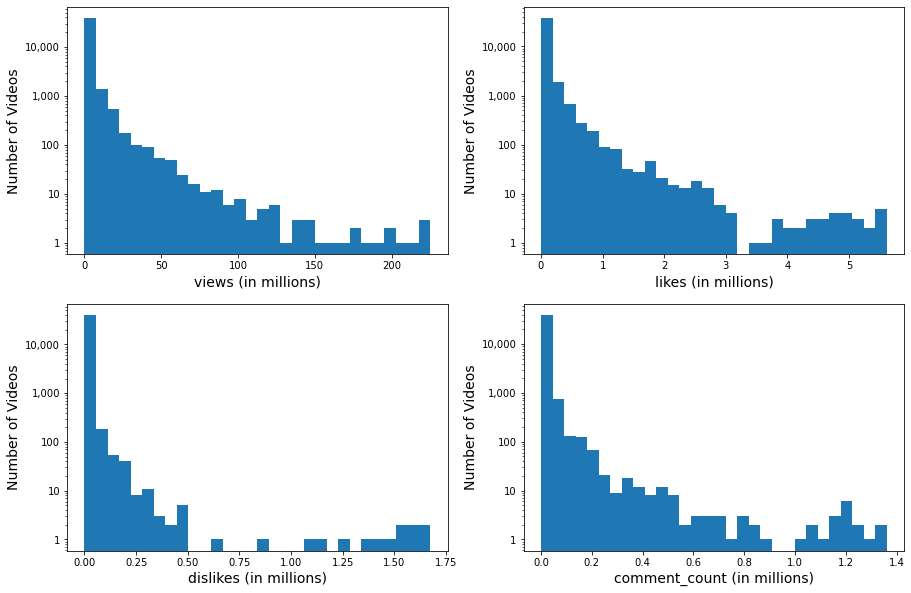

In [12]:
fig, ((ax1, ax2),(ax3, ax4)) = plt.subplots(2,2,figsize=(15,10))

for i, axs in enumerate([[ax1, ax2], [ax3, ax4]]):
    for j, ax in enumerate(axs):
        (df[indicators[i+j+i]]/1000000).plot(logy=True, kind='hist',bins=30, ax=ax)
        ax.set_xlabel(indicators[i+j+i]+' (in millions)', fontsize=14)
        ax.set_ylabel('Number of Videos', fontsize=14)
        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(fmt='{x:,.0f}'))

#### log with data

In [13]:
df_log =pd.DataFrame({'likes_log': np.log10(df['likes'] + 1),
              'views_log': np.log10(df['views'] + 1),
              'dislikes_log': np.log10(df['dislikes'] + 1),
              'comment_count_log': np.log10(df['comment_count'] + 1)})
df_log

,likes_log,views_log,dislikes_log,comment_count_log
0,4.8,5.9,3.5,4.2
1,5.0,6.4,3.8,4.1
2,5.2,6.5,3.7,3.9
3,4.0,5.5,2.8,3.3
4,5.1,6.3,3.3,4.2
...,...,...,...,...
40944,4.6,6.2,3.1,3.4
40945,4.8,6.0,2.6,3.6
40946,4.7,6.0,3.0,3.6
40947,5.3,6.8,3.5,4.1


In [14]:
df = df.join(df_log)
df

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_name,likes_log,views_log,dislikes_log,comment_count_log
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,...,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,People & Blogs,4.8,5.9,3.5,4.2
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,...,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",Entertainment,5.0,6.4,3.8,4.1
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,...,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy,5.2,6.5,3.7,3.9
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,...,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,Entertainment,4.0,5.5,2.8,3.3
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,...,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment,5.1,6.3,3.3,4.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40944,BZt0qjTWNhw,18.14.06,The Cat Who Caught the Laser,AaronsAnimals,15,2018-05-18T13:00:04.000Z,"aarons animals|""aarons""|""animals""|""cat""|""cats""...",1685609,38160,1385,...,https://i.ytimg.com/vi/BZt0qjTWNhw/default.jpg,False,False,False,The Cat Who Caught the Laser - Aaron's Animals,Pets & Animals,4.6,6.2,3.1,3.4
40945,1h7KV2sjUWY,18.14.06,True Facts : Ant Mutualism,zefrank1,22,2018-05-18T01:00:06.000Z,[none],1064798,60008,382,...,https://i.ytimg.com/vi/1h7KV2sjUWY/default.jpg,False,False,False,NaN,People & Blogs,4.8,6.0,2.6,3.6
40946,D6Oy4LfoqsU,18.14.06,I GAVE SAFIYA NYGAARD A PERFECT HAIR MAKEOVER ...,Brad Mondo,24,2018-05-18T17:34:22.000Z,I gave safiya nygaard a perfect hair makeover ...,1066451,48068,1032,...,https://i.ytimg.com/vi/D6Oy4LfoqsU/default.jpg,False,False,False,I had so much fun transforming Safiyas hair in...,Entertainment,4.7,6.0,3.0,3.6
40947,oV0zkMe1K8s,18.14.06,How Black Panther Should Have Ended,How It Should Have Ended,1,2018-05-17T17:00:04.000Z,"Black Panther|""HISHE""|""Marvel""|""Infinity War""|...",5660813,192957,2846,...,https://i.ytimg.com/vi/oV0zkMe1K8s/default.jpg,False,False,False,How Black Panther Should Have EndedWatch More ...,Film & Animation,5.3,6.8,3.5,4.1


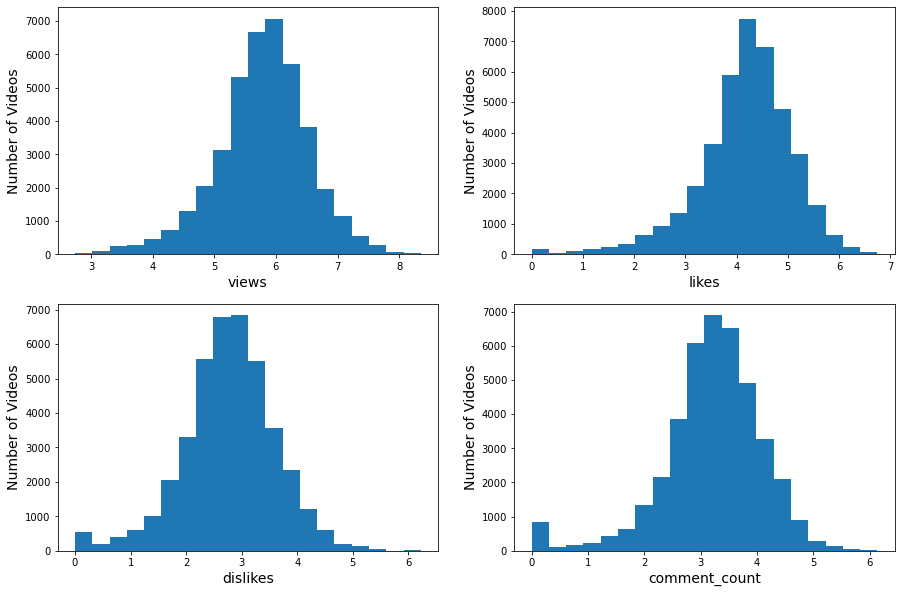

In [15]:
fig, ((ax1, ax2),(ax3, ax4)) = plt.subplots(2,2,figsize=(15,10))

for i, axs in enumerate([[ax1, ax2], [ax3, ax4]]):
    for j, ax in enumerate(axs):
        (df_log[indicators[i+j+i]+'_log']).plot(kind='hist',bins=20, ax=ax)
        ax.set_xlabel(indicators[i+j+i], fontsize=14)
        ax.set_ylabel('Number of Videos', fontsize=14)
        

### probability distribution

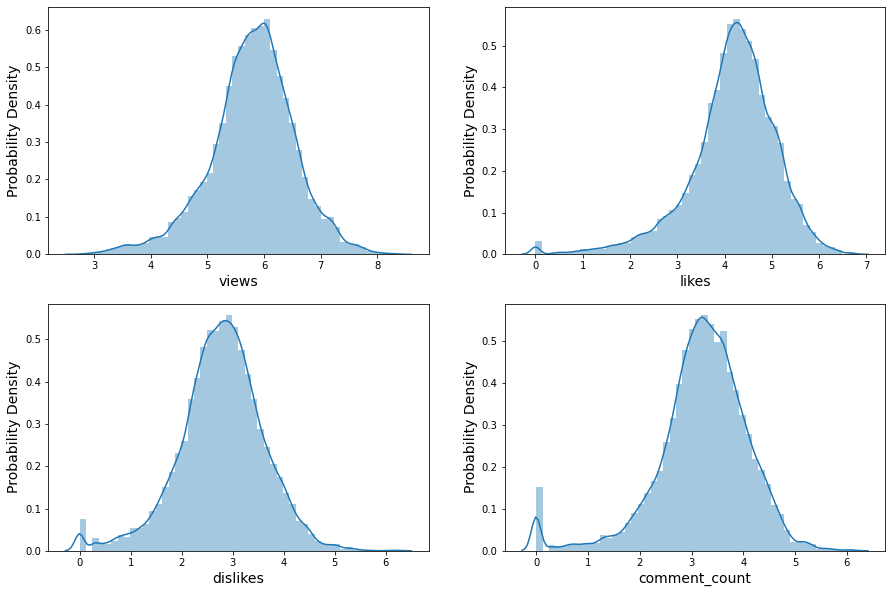

In [16]:
fig, ((ax1, ax2),(ax3, ax4)) = plt.subplots(2,2,figsize=(15,10))

for i, axs in enumerate([[ax1, ax2], [ax3, ax4]]):
    for j, ax in enumerate(axs):
        sns.distplot(df_log[indicators[i+j+i]+'_log'], ax=ax)
        ax.set_xlabel(indicators[i+j+i], fontsize=14)
        ax.set_ylabel('Probability Density', fontsize=14)

<font size=3>The four interactions roughly follow the log normal distribution.\
Easy to find statistical properties.\
Statistical features of original data could be derived from the transformed data.</font>  


## 1.2 publish time analysis 

In [17]:
df_time =pd.DataFrame({
                        'publish_time': pd.to_datetime(df['publish_time'])
                        })
df_time

,publish_time
0,2017-11-13 17:13:01+00:00
1,2017-11-13 07:30:00+00:00
2,2017-11-12 19:05:24+00:00
3,2017-11-13 11:00:04+00:00
4,2017-11-12 18:01:41+00:00
...,...
40944,2018-05-18 13:00:04+00:00
40945,2018-05-18 01:00:06+00:00
40946,2018-05-18 17:34:22+00:00
40947,2018-05-17 17:00:04+00:00


In [18]:
df_time["publish_hour"] = df_time["publish_time"].dt.hour
df_time

,publish_time,publish_hour
0,2017-11-13 17:13:01+00:00,17
1,2017-11-13 07:30:00+00:00,7
2,2017-11-12 19:05:24+00:00,19
3,2017-11-13 11:00:04+00:00,11
4,2017-11-12 18:01:41+00:00,18
...,...,...
40944,2018-05-18 13:00:04+00:00,13
40945,2018-05-18 01:00:06+00:00,1
40946,2018-05-18 17:34:22+00:00,17
40947,2018-05-17 17:00:04+00:00,17


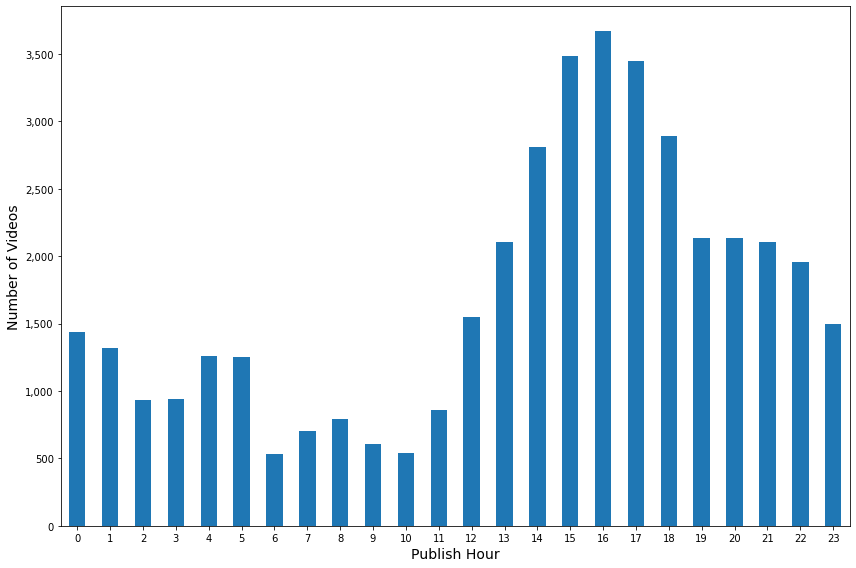

In [19]:
ax = df_time['publish_hour'].value_counts().sort_index().plot(
    kind='bar', figsize=(12,8), rot=0)

ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

ax.set_xlabel('Publish Hour', fontsize=14)
ax.set_ylabel('Number of Videos', fontsize=14)

plt.tight_layout()
plt.show()

# 2 find relationships among features

## 2.1 similarity and difference of distributions

In [20]:
hist_data = [df_log["views_log"], df_log["likes_log"], df_log["dislikes_log"],df_log["comment_count_log"]]

group_labels = ['log of views', 'log of likes', 'log of dislikes', 'log of comment']

fig = ff.create_distplot(hist_data, group_labels,bin_size=.2, show_rug=False)

fig.show()

## 2.2 correlation

In [21]:
corr = df0.select_dtypes(include=['number', 'bool']).drop(columns=['category_id', 'video_error_or_removed'])
corr.head(2)

,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled
0,748374,57527,2966,15954,False,False
1,2418783,97185,6146,12703,False,False


In [22]:
pd.options.display.float_format = '{:,.3f}'.format
corr.corr()

,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled
views,1.000,0.849,0.472,0.618,0.003,0.015
likes,0.849,1.000,0.447,0.803,-0.029,-0.021
dislikes,0.472,0.447,1.000,0.700,-0.004,-0.008
comment_count,0.618,0.803,0.700,1.000,-0.028,-0.014
comments_disabled,0.003,-0.029,-0.004,-0.028,1.000,0.319
ratings_disabled,0.015,-0.021,-0.008,-0.014,0.319,1.000


### heap map

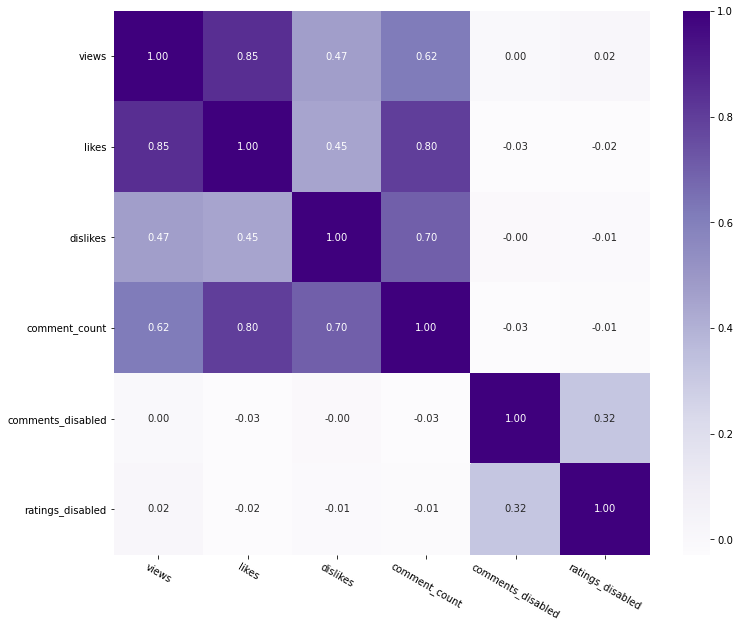

In [23]:
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(corr.corr(), fmt=".2f", annot=True, cmap='Purples', ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=-30)
plt.show()

<font size=3> 
the strongest positive correlation is between views and likes\
emotions(likes, dislikes) also have strong positive correlation with comments.\
When compare with views, dislikes brings a larger possibility of comments.</font>

In [24]:
corr2 = corr.select_dtypes(include=['number'])
corr2

,views,likes,dislikes,comment_count
0,748374,57527,2966,15954
1,2418783,97185,6146,12703
2,3191434,146033,5339,8181
3,343168,10172,666,2146
4,2095731,132235,1989,17518
...,...,...,...,...
40944,1685609,38160,1385,2657
40945,1064798,60008,382,3936
40946,1066451,48068,1032,3992
40947,5660813,192957,2846,13088


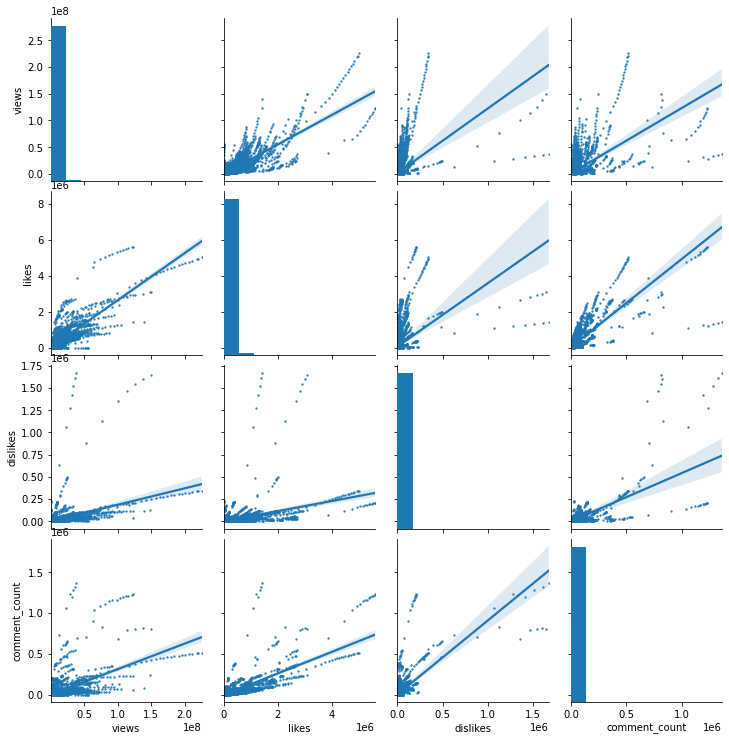

In [25]:
g = sns.pairplot(corr2, kind="reg", plot_kws = dict(scatter_kws=dict(s=2)))

# 3 what do people like to watch

### 3.1 channels with biggest numbers of trending videos

In [26]:
ch = df.groupby('channel_title')['channel_title'].count().sort_values(ascending=False).reset_index(name='count')

pd.set_option('display.max_rows', ch.shape[0]+1)
ch.head()

,channel_title,count
0,ESPN,203
1,The Tonight Show Starring Jimmy Fallon,197
2,Vox,193
3,TheEllenShow,193
4,Netflix,193


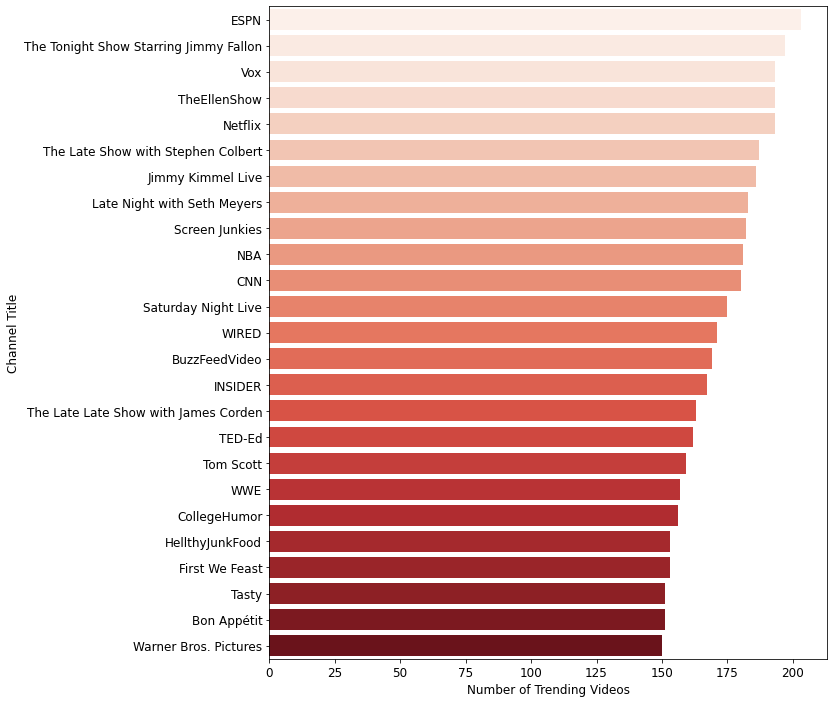

In [27]:
fig, ax = plt.subplots(figsize=(10,12))
sns.barplot(data=ch.head(25), x='count', y='channel_title', 
            palette=sns.color_palette("Reds", n_colors=25), ax=ax)
ax.tick_params(axis='both',which='major',labelsize=12)
ax.set_ylabel('Channel Title', fontsize=12)
ax.set_xlabel('Number of Trending Videos', fontsize=12)
plt.show()

 Then a natural though arises, could we confirm this phenomenon not in channel level but in category level, 
 also find the exact sort.

### 3.2 video category with largest number of trending videos

In [28]:
ct = df.groupby('category_name')['category_name'].count().sort_values(ascending=False).reset_index(name='count')
ct

,category_name,count
0,Entertainment,9964
1,Music,6472
2,Howto & Style,4146
3,Comedy,3457
4,People & Blogs,3210
5,News & Politics,2487
6,Science & Technology,2401
7,Film & Animation,2345
8,Sports,2174
9,Education,1656


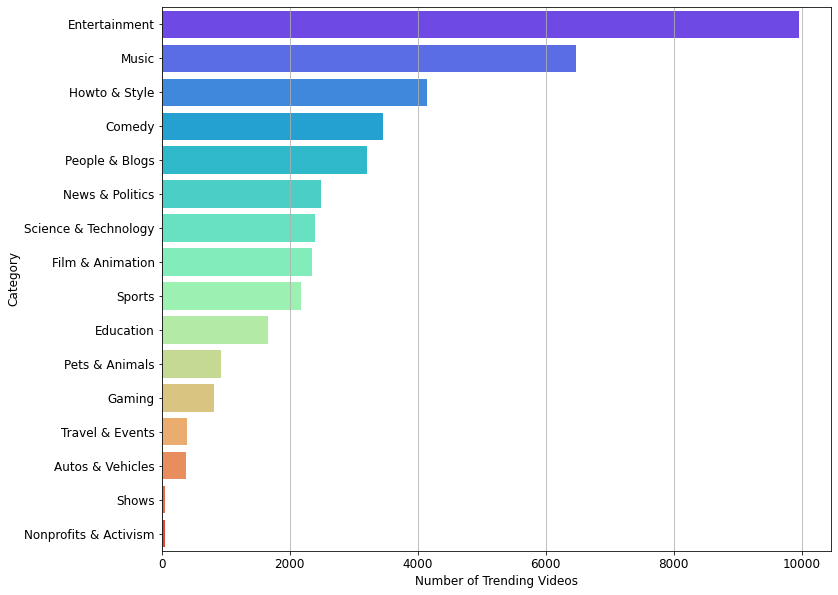

In [29]:
fig, ax = plt.subplots(figsize=(12,10))
sns.barplot(data=ct, x='count', y='category_name', 
            palette=sns.color_palette("rainbow", n_colors=16), ax=ax)
ax.tick_params(axis='both',which='major',labelsize=12)
ax.set_ylabel('Category', fontsize=12)
ax.set_xlabel('Number of Trending Videos', fontsize=12)
ax.xaxis.grid(True)
plt.show()

people don't only want to watch and think, but also want to do something,\
to make action and experience.\
These will brind people with even higher satisfaction.\
Most research have been done for their own products, \
e.g. Amazon recommendation systems, \
but they may find more needs from the videos that apparently have no correlation with their products.

### 3.3 category with more interactions

In [30]:
ct2 = df.groupby(['category_name'])
ct3 = ct2.sum()
ct4 = ct3.sort_values(by='views', ascending=False).reset_index()

In [31]:
ct_views = ct3[['views']].sort_values(by='views',ascending=False).reset_index()
ct_likes = ct3[['likes']].sort_values(by='likes',ascending=False).reset_index()
ct_dislikes = ct3[['dislikes']].sort_values(by='dislikes',ascending=False).reset_index()
ct_comment = ct3[['comment_count']].sort_values(by='comment_count',ascending=False).reset_index()
ct_comment.head()

,category_name,comment_count
0,Music,125296396
1,Entertainment,73566498
2,People & Blogs,24778032
3,Howto & Style,23149550
4,Comedy,22545582


In [32]:
def billions(x, pos):
    return '$%1.1fB' % (x * 1e-9)

formatter1 = FuncFormatter(billions)

def millions(x, pos):
    return '$%1.1fM' % (x * 1e-6)

formatter2 = FuncFormatter(millions)

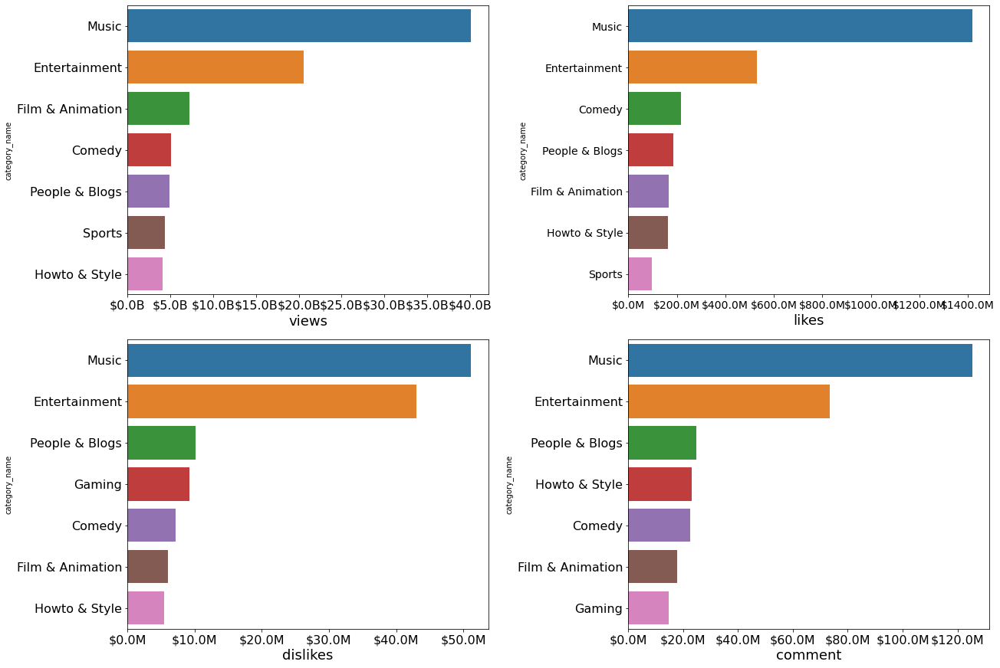

In [33]:
fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2,figsize=(18,12), constrained_layout=True)

sns.barplot(data=ct_views.head(7), x='views', y='category_name', ax=ax1) 
ax1.tick_params(axis='both',which='major',labelsize=16)
ax1.xaxis.set_major_formatter(formatter1)
ax1.set_yticklabels(ax1.get_yticklabels())
ax1.set_xlabel('views',fontsize=18)

sns.barplot(data=ct_likes.head(7), x='likes', y='category_name', ax=ax2) 
ax2.tick_params(axis='both',which='major',labelsize=14)
ax2.xaxis.set_major_formatter(formatter2)
ax2.set_yticklabels(ax2.get_yticklabels())
ax2.set_xlabel('likes',fontsize=18)

sns.barplot(data=ct_dislikes.head(7), x='dislikes', y='category_name', ax=ax3) 
ax3.tick_params(axis='both',which='major',labelsize=16)
ax3.xaxis.set_major_formatter(formatter2)
ax3.set_yticklabels(ax3.get_yticklabels())
ax3.set_xlabel('dislikes',fontsize=18)

sns.barplot(data=ct_comment.head(7), x='comment_count', y='category_name',ax=ax4) 
ax4.tick_params(axis='both',which='major',labelsize=16)
ax4.xaxis.set_major_formatter(formatter2)
ax4.set_yticklabels(ax4.get_yticklabels())
ax4.set_xlabel('comment',fontsize=18)

plt.show()

In [34]:
ct4.head(2)

,category_name,category_id,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,video_error_or_removed,likes_log,views_log,dislikes_log,comment_count_log
0,Music,64720,40132892190,1416838584,51179008,125296396,9.000,24.000,0.000,"30,392.178","39,692.785","20,051.705","22,995.752"
1,Entertainment,239136,20604388195,530516491,42987663,73566498,196.000,30.000,8.000,"40,866.293","57,856.891","27,657.507","31,239.867"


In [35]:
fig = go.Figure(data=[
    go.Bar(name='views', x=ct4['category_name'], y=(ct4['views']/ct4['views'].sum())),
    go.Bar(name='likes', x=ct4['category_name'], y=(ct4['likes']/ct4['likes'].sum())),
    go.Bar(name='dislikes', x=ct4['category_name'], y=(ct4['dislikes']/ct4['dislikes'].sum())),
    go.Bar(name='comments', x=ct4['category_name'], y=(ct4['comment_count']/ct4['comment_count'].sum())),
])
fig.show()

In [41]:
single1 = df.groupby(['category_name']).get_group('News & Politics')
single2 = df.groupby(['category_name']).get_group('Gaming')
single2.head(2)

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,ratings_disabled,video_error_or_removed,description,category_name,likes_log,views_log,dislikes_log,comment_count_log,ratio,ratio_log
131,lsfzA7sWlOM,17.14.11,L.A. Noire - Nintendo Switch Trailer,Nintendo,20,2017-11-09T19:59:48.000Z,"nintendo|""play""|""play nintendo""|""game""|""gamepl...",154872,7683,164,...,False,False,Amid the post-war boom of Hollywood's Golden A...,Gaming,3.886,5.190,2.217,3.239,46.848,1.680
392,lsfzA7sWlOM,17.15.11,L.A. Noire - Nintendo Switch Trailer,Nintendo,20,2017-11-09T19:59:48.000Z,"nintendo|""play""|""play nintendo""|""game""|""gamepl...",161231,7803,169,...,False,False,Amid the post-war boom of Hollywood's Golden A...,Gaming,3.892,5.207,2.230,3.170,46.172,1.674


In [37]:
single = pd.concat([single1,single2])

In [42]:
df['ratio']=df['likes']/df['dislikes']
df['ratio_log']=np.log10(df['ratio']+1)
df.head(2)

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,ratings_disabled,video_error_or_removed,description,category_name,likes_log,views_log,dislikes_log,comment_count_log,ratio,ratio_log
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,...,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,People & Blogs,4.760,5.874,3.472,4.203,19.395,1.310
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,...,False,False,"One year after the presidential election, John...",Entertainment,4.988,6.384,3.789,4.104,15.813,1.226


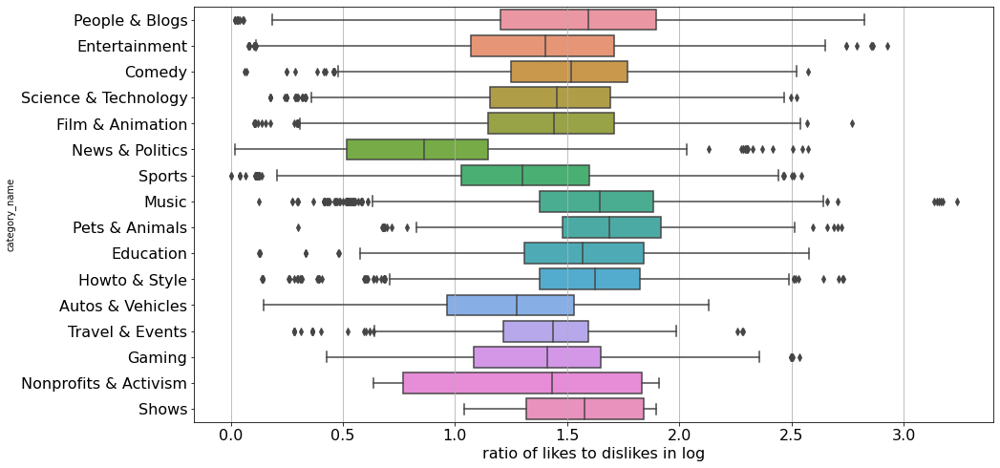

In [39]:
fig, ax = plt.subplots(figsize=(15,8))

sns.boxplot(data=df, x='ratio_log', y='category_name')
ax.tick_params(axis='both',which='major',labelsize=16)
#ax.set_ylabel('Category', fontsize=12)
ax.set_xlabel('ratio of likes to dislikes in log', fontsize=16)
ax.xaxis.grid(True)

plt.show()

# Overall Conclusion and Extrapolating Prediction


<font size=4>  
- __The user interactions roughly follow log normal distributions,\
 and they have some strong correlations.__  
  
- __The top 2 popular categories are entertainments and music, following with comedy, film&animation and People&Blogs.\
News&Politics and Nonprofits&Activism videos have the lowest ratio of likes to dislikes.__

</font>



# References

Analysis of YouTube Trending Videos of 2019 (US)\
https://github.com/ammar1y/YouTube-Trending-Videos-Analysis-2019/blob/master/YT-trending-analysis-2019-US.ipynb

YouTube Trending Videos Analysis (More Than 40,000 Videos)\
https://www.kaggle.com/ammar111/youtube-trending-videos-analysis

YouTube Data Exploration and Plotly Visualization\
https://kaggle.com/skalskip/youtube-data-exploration-and-plotly-visualization

Extensive USA Youtube [EDA]\
https://www.kaggle.com/kabure/extensive-usa-youtube-eda